# Geospatial Exploratory Data Analysis

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import json
import os
import sys
import warnings
from datetime import datetime
from glob import glob
from itertools import product
from typing import Dict, List, Union
from IPython.display import Image

import duckdb
import folium
import geopandas as gpd
import numpy as np
import pandas as pd
from watermark import watermark

In [3]:
PROJ_ROOT = os.pardir
src_dir = os.path.join(PROJ_ROOT, "src")
sys.path.append(src_dir)

In [4]:
%aimport file_utils
import file_utils as flut

%aimport open_data
import open_data as od

%aimport pandas_utils
import pandas_utils as pu

## About

### Objective

The previously retrieved bike share metadata and geospatial datasets are combined in order to explore geospatial patterns in the Bike Share Toronto network.

### Data

The following previously-created processed dataset is used in this exploratory data analysis

1. list of downtown neighbourhoods (raw)
2. station info (includes geodata, raw)
3. college and university locations (raw)
4. public transit (train) lines (raw)
5. neighbourhood boundaries (raw)
6. identification of bike share stations as top-performers or not (processed)

### Notes

1. This is the second part of the two-part EDA for this project. The previous step contained the first part of the EDA, in which temporal patterns in the processed data were studied.
2. Using geospatial insights, recommendations for stations to be used in the digital ad campaign will be made in order to maximize exposure while also minimizing costs.

### Assumptions

1. Same as in data retrieval and processing steps.

### Outputs

1. Recommendations file with logic to filter currently active stations based on geospatial insights.

## User Inputs

In [5]:
# top-performing stations
cols_top_performers_to_load = [
    'station_id',
    'name',
    'credit',
    'census_tract_id',
    'is_downtown',
    'Location',
    'is_top_perform_station',
    'is_top_perform_station_weekday',
    'is_top_perform_station_weekend'
]
top_performer_mapper = [
    {"station_type": 'Top Performer', "le_tp": 0, 'color_tp': 'darkred'},
    {"station_type": 'Top Performer Weekday Only', "le_tp": 1, 'color_tp': 'darkorange'},
    {"station_type": 'Top Performer Weekend Only', "le_tp": 2, 'color_tp': '#17becf'},
    {"station_type": 'Others', "le_tp": 3, 'color_tp': '#a1d99b'},
]

# geodata
# # station info
station_info_cols_to_load = [
    'station_id',
    'name',
    'lat',
    'lon',
    'physical_configuration',
    'rental_methods',
    'capacity',
    'is_charging_station',
    'Neighbourhood',
    'census_tract_id',
]
phys_cfg_mapper = [
    {"physical_configuration": 'Regular', "le": 0, 'color': 'darkturquoise'},
    {"physical_configuration": 'ElectricBike', "le": 1, 'color': 'mediumseagreen'},
    {"physical_configuration": 'SmartMapFrame', "le": 2, 'color': 'orange'},
    {"physical_configuration": 'Vault', "le": 3, 'color': 'navy'},
    {"physical_configuration": 'RegularLitMapFrame', "le": 4, 'color': 'yellowgreen'},
    {"physical_configuration": 'SmartLitMapFrame', "le": 5, 'color': 'purple'},
]
stations_tooltip = [
    "Name",
    'Physical Configuration',
    'Capacity',
    'Neighbourhood',
    'Location',
]
# # Toronto Open Data base URL
base_url = "https://ckan0.cf.opendata.inter.prod-toronto.ca"
# # Toronto Open Data geodata dataset parameters
neigh_boundary_params = {"id": "neighbourhoods"}
# # co-ordinate reference system and projection
crs = 4326
epsg = 4536
# # census tracts
fname_census_tracts = 'lct_000b21a_e.shp'

# export to disk
my_timezone = 'America/Toronto'

In [6]:
data_dir = os.path.join(PROJ_ROOT, 'data')
raw_data_dir = os.path.join(data_dir, 'raw', 'systems', 'toronto')
processed_data_dir = os.path.join(data_dir, 'processed')
reports_dir = os.path.join(PROJ_ROOT, 'reports')
figures_dir = os.path.join(reports_dir, 'figures')

# station info for currently active stations
fpath_stations_info = glob(
    os.path.join(raw_data_dir, 'stations_info__*.parquet.gzip')
)[0]

# colleges and universities
fpath_colleges_univs = glob(
    os.path.join(
        raw_data_dir, 'colleges_univs__*.parquet.gzip'
    )
)[0]

# downtown neighbourhoods
fpath_downtown_neighs = glob(
    os.path.join(raw_data_dir, 'downtown_neighbourhoods__*.parquet.gzip')
)[0]

# geodata
# # census tracts
shp_filepath_census = os.path.join(
    raw_data_dir, os.path.splitext(fname_census_tracts)[0], fname_census_tracts
)

# # public transit lines
fpath_transit_lines = glob(
    os.path.join(
        raw_data_dir, 'ttc-subway-shapefile-wgs84', '*.shp'
    )
)[0]

# top performing stations
fpath_top_stations = glob(
    os.path.join(processed_data_dir, 'stations_performance__*.parquet.gzip')
)[0]

In [7]:
def run_sql_query(query: str, verbose: bool=False) -> pd.DataFrame:
    """Run SQL query using DuckDB."""
    with warnings.catch_warnings():
        warnings.simplefilter("ignore", FutureWarning)
        df_query = duckdb.sql(query).df()
    if verbose:
        print(f"Query returned {len(df_query):,} rows")
    return df_query

## Get Data

### Downtown Neighbourhoods

Show previously retrieved neighbourhoods within downtown Toronto

In [8]:
%%time
query = f"""
        SELECT Neighbourhood,
               Location,
               is_downtown AS Downtown
        FROM read_parquet({[fpath_downtown_neighs]})
        """
df_downtown_neighs = run_sql_query(query).convert_dtypes()
pu.show_df(df_downtown_neighs)

column,Neighbourhood,Location,Downtown
dtype,string[python],string[python],boolean
nunique,24,3,2
missing,0,0,0
0,University,Downtown,True
1,Kensington-Chinatown,Downtown,True
2,Wellington Place,Downtown,True
3,Harbourfront-CityPlace,Downtown,True
4,Bay-Cloverhill,Downtown,True
5,Yonge-Bay Corridor,Downtown,True
6,St Lawrence-East Bayfront-The Islands,Downtown,True


CPU times: user 11.7 ms, sys: 0 ns, total: 11.7 ms
Wall time: 11.3 ms


### Neighbourhoods

Retrieve link to [neighbourhood boundaries geodata](https://open.toronto.ca/dataset/neighbourhoods/)

In [9]:
%%time
shp_filepath = od.download_geo_open_data(
    raw_data_dir, base_url, neigh_boundary_params
)

Retrieved dataset neighbourhoods from filepath https://ckan0.cf.opendata.inter.prod-toronto.ca/dataset/neighbourhoods/resource/1d38e8b7-65a8-4dd0-88b0-ad2ce938126e/download/neighbourhoods-4326.geojson
CPU times: user 29.5 ms, sys: 1.66 ms, total: 31.1 ms
Wall time: 189 ms


Load neighbourhood boundaries geodata

In [10]:
%%time
gdf_neighs = (
    gpd.read_file(shp_filepath)
    .rename(columns={"AREA_NAME": 'Neighbourhood'})
    .merge(
        df_downtown_neighs[['Neighbourhood', 'Location']],
        on='Neighbourhood',
        how='left',
    )
    .fillna({"Location": "Others"})
)
pu.show_df(gdf_neighs)

ERROR 1: PROJ: proj_create_from_database: Open of /opt/conda/envs/eda/share/proj failed


column,_id,AREA_ID,AREA_ATTR_ID,PARENT_AREA_ID,AREA_SHORT_CODE,AREA_LONG_CODE,Neighbourhood,AREA_DESC,CLASSIFICATION,CLASSIFICATION_CODE,OBJECTID,geometry,Location
dtype,int64,int64,int64,int64,object,object,object,object,object,object,float64,geometry,string[python]
nunique,158,158,158,1,158,158,158,158,3,3,158,158,4
missing,0,0,0,0,0,0,0,0,0,0,0,0,0
0,1,2502366,26022881,0,174,174,South Eglinton-Davisville,South Eglinton-Davisville (174),Not an NIA or Emerging Neighbourhood,NA,17824737.0,"MULTIPOLYGON (((-79.38635 43.69783, -79.38623 ...",Others
1,2,2502365,26022880,0,173,173,North Toronto,North Toronto (173),Not an NIA or Emerging Neighbourhood,NA,17824753.0,"MULTIPOLYGON (((-79.39744 43.70693, -79.39837 ...",Others
2,3,2502364,26022879,0,172,172,Dovercourt Village,Dovercourt Village (172),Not an NIA or Emerging Neighbourhood,NA,17824769.0,"MULTIPOLYGON (((-79.43411 43.66015, -79.43537 ...",Others
3,4,2502363,26022878,0,171,171,Junction-Wallace Emerson,Junction-Wallace Emerson (171),Not an NIA or Emerging Neighbourhood,NA,17824785.0,"MULTIPOLYGON (((-79.43870 43.66766, -79.43841 ...",Others
4,5,2502362,26022877,0,170,170,Yonge-Bay Corridor,Yonge-Bay Corridor (170),Not an NIA or Emerging Neighbourhood,NA,17824801.0,"MULTIPOLYGON (((-79.38404 43.64497, -79.38502 ...",Downtown
...,...,...,...,...,...,...,...,...,...,...,...,...,...
153,154,2502213,26022728,0,001,001,West Humber-Clairville,West Humber-Clairville (1),Not an NIA or Emerging Neighbourhood,NA,17827185.0,"MULTIPOLYGON (((-79.59037 43.73401, -79.58942 ...",Others


CPU times: user 253 ms, sys: 21.2 ms, total: 274 ms
Wall time: 510 ms


Get neighbourhood boundaries geodata for downtown neighbourhoods

In [11]:
%%time
gdf_downtown_neighs = (
    gdf_neighs[['Neighbourhood', 'geometry']]
    .merge(
        df_downtown_neighs,
        on='Neighbourhood',
        how='left',
    )
    .dropna(subset=['Downtown'])
    .assign(Downtown=lambda df: df['Downtown'].astype(pd.Int64Dtype()))
    .reset_index(drop=True)
)
pu.show_df(gdf_downtown_neighs)

column,Neighbourhood,geometry,Location,Downtown
dtype,object,geometry,string[python],Int64
nunique,24,24,3,2
missing,0,0,0,0
0,Yonge-Bay Corridor,"MULTIPOLYGON (((-79.38404 43.64497, -79.38502 ...",Downtown,1
1,Bay-Cloverhill,"MULTIPOLYGON (((-79.38743 43.66051, -79.39049 ...",Downtown,1
2,Downtown Yonge East,"MULTIPOLYGON (((-79.37655 43.66201, -79.37590 ...",Downtown,1
3,Church-Wellesley,"MULTIPOLYGON (((-79.38168 43.66139, -79.38183 ...",Downtown,1
4,St Lawrence-East Bayfront-The Islands,"MULTIPOLYGON (((-79.35268 43.65571, -79.35239 ...",Downtown,1
5,Harbourfront-CityPlace,"MULTIPOLYGON (((-79.38017 43.63989, -79.38005 ...",Downtown,1
6,Wellington Place,"MULTIPOLYGON (((-79.40070 43.64093, -79.40142 ...",Downtown,1


CPU times: user 37.7 ms, sys: 0 ns, total: 37.7 ms
Wall time: 37 ms


### Top-Performing Stations

Show previously classified stations as top-performers or not

In [12]:
%%time
query = f"""
        WITH t1 AS (
            SELECT {','.join(cols_top_performers_to_load)}
            FROM read_parquet({[fpath_top_stations]})
        )
        SELECT * EXCLUDE(station_id, name, is_downtown),
               station_id AS 'Station Id',
               name AS Name,
               is_downtown AS Downtown
        FROM t1
        """
df_top_stations = run_sql_query(query).convert_dtypes()
pu.show_df(df_top_stations)

column,credit,census_tract_id,Location,is_top_perform_station,is_top_perform_station_weekday,is_top_perform_station_weekend,Station Id,Name,Downtown
dtype,boolean,string[python],string[python],boolean,boolean,boolean,Int64,string[python],boolean
nunique,2,214,4,2,2,2,627,627,2
missing,0,0,0,0,1,0,0,0,0
0,True,5350012.04,Downtown,True,True,True,7076,York St / Queens Quay W,True
1,True,5350013.02,Downtown,True,True,True,7016,Bay St / Queens Quay W (Ferry Terminal),True
2,True,5350013.01,Downtown,True,True,True,7033,Union Station,True
3,True,5350012.04,Downtown,True,True,True,7175,HTO Park (Queens Quay W),True
4,True,5350008.02,West of Downtown,True,True,True,7203,Bathurst St/Queens Quay(Billy Bishop Airport),False
...,...,...,...,...,...,...,...,...,...
622,True,5350096.02,Others,False,False,False,7156,Salem Ave / Bloor St W,False


CPU times: user 16.5 ms, sys: 1.45 ms, total: 18 ms
Wall time: 16.9 ms


### Bike Share Station Info (MetaData)

Create a mapper to colour the bike share stations based on their `physical_configuration`

In [13]:
%%time
phys_cfg = pd.DataFrame.from_records(phys_cfg_mapper)
query = f"""
        SELECT * EXCLUDE(physical_configuration, color),
               physical_configuration AS 'Physical Configuration'
        FROM phys_cfg
        """
df_phys_cfg = run_sql_query(query).convert_dtypes()
pu.show_df(df_phys_cfg)

column,le,Physical Configuration
dtype,Int64,string[python]
nunique,6,6
missing,0,0
0,0,Regular
1,1,ElectricBike
2,2,SmartMapFrame
3,3,Vault
4,4,RegularLitMapFrame
5,5,SmartLitMapFrame


CPU times: user 8.07 ms, sys: 71 µs, total: 8.14 ms
Wall time: 7.69 ms


Create a mapper to colour the bike share stations based whether they were identified as a top-performing station or not

In [14]:
%%time
top_stations_color = pd.DataFrame.from_records(top_performer_mapper)
query = f"""
        SELECT * EXCLUDE(station_type, color_tp),
               station_type AS 'Station Type'
        FROM top_stations_color
        """
df_top_stations_color = run_sql_query(query).convert_dtypes()
pu.show_df(df_top_stations_color)

column,le_tp,Station Type
dtype,Int64,string[python]
nunique,4,4
missing,0,0
0,0,Top Performer
1,1,Top Performer Weekday Only
2,2,Top Performer Weekend Only
3,3,Others


CPU times: user 5.53 ms, sys: 2.19 ms, total: 7.72 ms
Wall time: 7.24 ms


Show the stations info data that was retrieved previously, containing station name, `physical_configuration`, associated neighbourhood name, etc.

In [15]:
%%time
query = f"""
        WITH t1 AS (
            SELECT {', '.join(station_info_cols_to_load)}
            FROM read_parquet({[fpath_stations_info]})
        )
        SELECT * EXCLUDE(
                   station_id,
                   name,
                   rental_methods,
                   Location,
                   Downtown,
               ),
               station_id AS 'Station Id',
               name AS Name,
               CONTAINS(LOWER(rental_methods), 'credit') AS credit,
               IFNULL(Location, 'Others') AS Location,
               COALESCE(Downtown, NULL, 0) AS Downtown
        FROM t1
        LEFT JOIN df_downtown_neighs USING (Neighbourhood)
        """
df_info = (
    run_sql_query(query)
    .astype({"Station Id": pd.Int64Dtype()})
    .convert_dtypes()
)
pu.show_df(df_info)

column,lat,lon,physical_configuration,capacity,is_charging_station,Neighbourhood,census_tract_id,Station Id,Name,credit,Location,Downtown
dtype,Float64,Float64,string[python],Int64,boolean,string[python],string[python],Int64,string[python],boolean,string[python],Int32
nunique,787,789,6,40,2,107,272,790,790,2,4,2
missing,0,0,0,0,0,0,0,0,0,0,0,0
0,43.664964,-79.38355,ELECTRICBIKESTATION,23,True,Church-Wellesley,5350063.06,7001,Wellesley Station Green P,True,Downtown,1
1,43.667333,-79.399429,REGULAR,19,False,University,5350061.00,7002,St. George St / Bloor St W,True,Downtown,1
2,43.648001,-79.383177,REGULAR,23,False,Yonge-Bay Corridor,5350014.00,7005,King St W / York St,True,Downtown,1
3,43.660439,-79.385525,REGULAR,19,False,Yonge-Bay Corridor,5350035.00,7006,Bay St / College St (East Side),True,Downtown,1
4,43.658148,-79.398167,REGULAR,19,False,Kensington-Chinatown,5350037.00,7007,College St / Huron St,True,Downtown,1
...,...,...,...,...,...,...,...,...,...,...,...,...
785,43.64283,-79.38409,REGULAR,14,False,Harbourfront-CityPlace,5350012.03,7467,Lower Simcoe St / Bremner Blvd,True,Downtown,1


CPU times: user 20.8 ms, sys: 1.68 ms, total: 22.4 ms
Wall time: 21.4 ms


Append identification of top-ranking stations to station metadata

In [16]:
%%time
query = f"""
        WITH t1 AS (
            SELECT *
            FROM df_info
            LEFT JOIN df_top_stations USING (
                'Station Id',
                Name,
                Downtown,
                Location,
                credit,
                census_tract_id
            )
        ),
        t2 AS (
            SELECT * EXCLUDE(
                     is_top_perform_station,
                     is_top_perform_station_weekday,
                     is_top_perform_station_weekend,
                     physical_configuration,
                     lat,
                     lon,
                     capacity,
                     is_charging_station,
                     census_tract_id,
                     credit,
                   ),
                   lat AS Lat,
                   lon AS Lon,
                   capacity AS Capacity,
                   is_charging_station AS 'Charging Station',
                   census_tract_id AS 'Census Tract Id',
                   credit AS Credit,
                   COALESCE(is_top_perform_station, NULL, FALSE) AS is_top_perform_station,
                   COALESCE(is_top_perform_station_weekday, NULL, FALSE) AS is_top_perform_station_weekday,
                   COALESCE(is_top_perform_station_weekend, NULL, FALSE) AS is_top_perform_station_weekend,
                   REPLACE(
                       REPLACE(
                           REPLACE(
                               REPLACE(
                                   REPLACE(
                                       REPLACE(
                                           REPLACE(
                                               physical_configuration,
                                               'STATION',
                                               ''
                                           ),
                                           'SMARTLITMAPFRAME',
                                           'SmartLitMapFrame'
                                       ),
                                       'SMARTMAPFRAME',
                                       'SmartMapFrame'
                                   ),
                                   'REGULARLITMAPFRAME',
                                   'RegularLitMapFrame'
                               ),
                               'VAULT',
                               'Vault'
                           ),
                           'ELECTRICBIKE',
                           'ElectricBike'
                       ),
                       'REGULAR',
                       'Regular'
                   ) AS 'Physical Configuration'
            FROM t1
        ),
        t3 AS (
            SELECT * EXCLUDE (
                       is_top_perform_station,
                       is_top_perform_station_weekday,
                       is_top_perform_station_weekend,
                   ),
                   (
                       CASE
                           WHEN is_top_perform_station = True
                           THEN 'Top Performer'
                           WHEN (is_top_perform_station = False
                           AND is_top_perform_station_weekday = True
                           AND is_top_perform_station_weekend = False)
                           THEN 'Top Performer Weekday Only'
                           WHEN (is_top_perform_station = False
                           AND is_top_perform_station_weekday = False
                           AND is_top_perform_station_weekend = True)
                           THEN 'Top Performer Weekend Only'
                       ELSE 'Others'
                       END
                   ) AS 'Station Type'
            FROM t2
        )
        SELECT *
        FROM t3
        LEFT JOIN df_phys_cfg USING ('Physical Configuration')
        LEFT JOIN df_top_stations_color USING ('Station Type')
        """
df_info = run_sql_query(query).convert_dtypes()
gdf_info = (
    gpd.GeoDataFrame(
        df_info,
        geometry=gpd.points_from_xy(df_info['Lon'], df_info['Lat']),
        crs=f"EPSG:{crs}",
    )
)
with pd.option_context('display.max_columns', None):
    pu.show_df(gdf_info)

column,Neighbourhood,Station Id,Name,Location,Downtown,Lat,Lon,Capacity,Charging Station,Census Tract Id,Credit,Physical Configuration,Station Type,le,le_tp,geometry
dtype,string[python],Int64,string[python],string[python],Int32,Float64,Float64,Int64,boolean,string[python],boolean,string[python],string[python],Int64,Int64,geometry
nunique,107,790,790,4,2,787,789,40,2,272,2,6,4,6,4,790
missing,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
0,Church-Wellesley,7001,Wellesley Station Green P,Downtown,1,43.664964,-79.38355,23,True,5350063.06,True,ElectricBike,Top Performer,1,0,POINT (-79.38355 43.66496)
1,University,7002,St. George St / Bloor St W,Downtown,1,43.667333,-79.399429,19,False,5350061.00,True,Regular,Top Performer,0,0,POINT (-79.39943 43.66733)
2,Yonge-Bay Corridor,7005,King St W / York St,Downtown,1,43.648001,-79.383177,23,False,5350014.00,True,Regular,Top Performer Weekday Only,0,1,POINT (-79.38318 43.64800)
3,Yonge-Bay Corridor,7006,Bay St / College St (East Side),Downtown,1,43.660439,-79.385525,19,False,5350035.00,True,Regular,Top Performer,0,0,POINT (-79.38553 43.66044)
4,Kensington-Chinatown,7007,College St / Huron St,Downtown,1,43.658148,-79.398167,19,False,5350037.00,True,Regular,Top Performer,0,0,POINT (-79.39817 43.65815)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
785,Runnymede-Bloor West Village,7561,Annette St / Jane St,Others,0,43.658574,-79.487246,15,False,5350104.00,True,Regular,Others,0,3,POINT (-79.48725 43.65857)


CPU times: user 40.4 ms, sys: 386 µs, total: 40.8 ms
Wall time: 38 ms


### Colleges and Universities

Show the college and university locations that were previously created

In [17]:
%%time
query = f"""
        SELECT cu_id AS 'College or Univ Id',
               cu_name AS Name,
               lat AS Lat,
               lon AS Lon,
               census_tract_id As 'Census Tract Id',
               Neighbourhood
        FROM read_parquet({[fpath_colleges_univs]})"""
df_colleges_univs = run_sql_query(query).convert_dtypes()
gdf_colleges_univs = gpd.GeoDataFrame(
    df_colleges_univs,
    geometry=gpd.points_from_xy(
        df_colleges_univs['Lon'], df_colleges_univs['Lat']
    ),
    crs=f"EPSG:{crs}",
)
pu.show_df(gdf_colleges_univs)

column,College or Univ Id,Name,Lat,Lon,Census Tract Id,Neighbourhood,geometry
dtype,Int64,string[python],Float64,Float64,string[python],string[python],geometry
nunique,17,17,16,16,14,14,16
missing,0,0,0,0,0,0,0
0,0,Centennial College (Progress Campus),43.783936,-79.228288,5350363.07,Woburn North,POINT (-79.22829 43.78394)
1,1,Centennial College (Morningside Campus),43.786243,-79.193541,5350362.03,Highland Creek,POINT (-79.19354 43.78624)
2,2,George Brown College (St James Campus),43.651708,-79.370745,5350016.00,Moss Park,POINT (-79.37074 43.65171)
3,3,George Brown College (Casa Loma Campus),43.676259,-79.410209,5350117.00,Casa Loma,POINT (-79.41021 43.67626)
4,4,George Brown College (Waterfront Campus),43.644076,-79.365148,5350017.02,St Lawrence-East Bayfront-The Islands,POINT (-79.36515 43.64408)
5,5,Humber College (North Campus),43.73031,-79.606184,5350248.04,West Humber-Clairville,POINT (-79.60618 43.73031)
6,6,Humber College (Lakeshore Campus),43.596058,-79.520169,5350205.00,New Toronto,POINT (-79.52017 43.59606)


CPU times: user 10.7 ms, sys: 3.08 ms, total: 13.8 ms
Wall time: 13.3 ms


### Census Tracts

Load census tract boundaries geodata

In [18]:
%%time
df_census_tracts = (
    gpd.read_file(shp_filepath_census)
    .query(
        "(PRUID == '35') & "
        "(CTUID.str.startswith('535')) & "
        "(CTNAME.str.startswith('01') | "
        "CTNAME.str.startswith('02') | "
        "CTNAME.str.startswith('03') | "
        "CTNAME.str.startswith('00'))"
    )
    .reset_index(drop=True)
    .to_crs(crs)
    .drop(columns=['DGUID', 'CTNAME', 'LANDAREA', 'PRUID', 'geometry'])
    .rename(columns={"CTUID": "census_tract_id"})
    .convert_dtypes()
)
pu.show_df(df_census_tracts)

column,census_tract_id
dtype,string[python]
nunique,583
missing,0
0,5350128.04
1,5350363.06
2,5350363.07
3,5350378.23
4,5350378.24
...,...
578,5350210.04


CPU times: user 2.25 s, sys: 40.5 ms, total: 2.3 s
Wall time: 2.29 s


### Public Transit (Train) Routes

Show previously download geodata for public transit (train) lines for the city

In [19]:
%%time
gdf_train = (
    gpd.read_file(fpath_transit_lines)
    .assign(color=["goldenrod", "green", "blue", "magenta"])
    .rename(
        columns=lambda x: (
            x.lower()
            .replace('_',' ')
            .title()
            .replace('Is ', '')
        )
    )
    .rename(
        columns={
            "Objectid": "Object Id",
            'Rid': "Route Id",
            'Geometry': 'geometry',
        }
    )
)
pu.show_df(gdf_train)

column,Object Id,Route Name,Route Id,geometry,Color
dtype,float64,object,int64,geometry,object
nunique,4,4,4,4,4
missing,0,0,0,0,0
0,53420.0,LINE 1 (YONGE-UNIVERSITY),1,"LINESTRING (-79.52813 43.79677, -79.52689 43.7...",goldenrod
1,53421.0,LINE 2 (BLOOR - DANFORTH),2,"LINESTRING (-79.53540 43.63781, -79.53386 43.6...",green
2,53422.0,LINE 3 (SCARBOROUGH),3,"LINESTRING (-79.26332 43.73266, -79.26332 43.7...",blue
3,53423.0,LINE 4 (SHEPPARD),4,"LINESTRING (-79.41113 43.76145, -79.40981 43.7...",magenta


CPU times: user 20.4 ms, sys: 149 µs, total: 20.6 ms
Wall time: 20.1 ms


## Show Map of Current Station Locations

Create a map showing the neighbourhoods (with downtown neighbourhoods highlighted), train lines, colleges and universities and current bike share stations using the following approach

1. add neighbourhoods choropleth to map
2. define and add tooltip to neighbourhoods choropleth
3. add downtown neighbourhoods choropleth to map
4. define and add tooltip to downtown neighbourhoods choropleth
5. add train lines to map
6. add college and university locations (points) to map (with tooltip)
7. add station locations (points) to map (with tooltip)

In [20]:
def plot_folium_map(
    geo_neighs: gpd.GeoDataFrame,
    geo_downtown_neighs: gpd.GeoDataFrame,
    geo_train: gpd.GeoDataFrame,
    geo_colleges_univs: gpd.GeoDataFrame,
    geo_info: gpd.GeoDataFrame,
    station_mapper: List[Dict[str, Union[str, int]]],
    xvar_neighs: str,
    yvar_neighs: str,
    yvar_downtown_neighs: str,
    marker_opacity: float,
    highlight_marker_fill_opacity: float,
    neigh_highlight_weight: int,
    neigh_line_thickness: float,
    neigh_style_line_thickness: float,
    neigh_tooltip: List[str],
    neigh_opacity: float,
    neigh_cmap: str,
    neigh_legend_text_color: str,
    downtown_neigh_cmap: str,
    downtown_neigh_opacity: float,
    downtown_neigh_legend_text_color: str,
    colleges_univs_marker_color: str,
    colleges_univs_tooltip: List[str],
    colleges_univs_marker_size: int,
    train_line_thickness: int,
    stations_marker_size: int,
    stations_marker_color: str,
    stations_tool_tip: List[str],
    station_le_col: str,
    station_color_col: str,
    stations_color_by_col: str='physical_configuration',
    stations_color_by_col_title: str='Physical Configuration',
) -> folium.Map:
    """Create layered map with Folium."""
    m = folium.Map(
        location=[43.6532, -79.3832],
        tiles='Cartodb Positron',
        zoom_start=11,
    )
    
    # 1. add neighbourhoods to map
    choro_data = json.loads(geo_neighs.to_json())
    fg = folium.FeatureGroup(
        name='<span style="color: {col};">{txt}</span>'.format(
            txt='Neighbourhood',
            col=neigh_legend_text_color,
        ),
    )
    pc = folium.Choropleth(
        geo_data=choro_data,
        data=geo_neighs,
        columns=[xvar_neighs, yvar_neighs],
        key_on=f'feature.properties.{xvar_neighs}',
        fill_color=neigh_cmap,
        fill_opacity=neigh_opacity, 
        line_opacity=neigh_line_thickness,
        legend_name=None,
    ).geojson.add_to(fg)
    m.add_child(fg)
    
    # 2. define choropleth tooltip
    tooltip_choro = folium.features.GeoJsonTooltip(
        fields=neigh_tooltip,
        aliases=neigh_tooltip,
        localize=True,
        labels=True,
    )
    # 2. add choropleth tooltip to map
    folium.features.GeoJson(
        data=geo_neighs,
        smooth_factor=2,
        style_function=lambda x: {
            'color': 'black',
            'fillColor': 'transparent',
            'weight': neigh_style_line_thickness,
        },
        tooltip=tooltip_choro,
        highlight_function=lambda x: {
            'weight': neigh_highlight_weight, 'fillColor': 'grey'
        },
    ).add_to(pc)
    
    # 3. add downtown neighbourhoods to map
    choro_data = json.loads(geo_downtown_neighs.to_json())
    fg2 = folium.FeatureGroup(
        name='<span style="color: {col};">{txt}</span>'.format(
            txt='Downtown Neighbourhood',
            col=downtown_neigh_legend_text_color,
        )
    )
    pc2 = folium.Choropleth(
        geo_data=choro_data,
        data=geo_downtown_neighs,
        columns=[xvar_neighs, yvar_downtown_neighs],
        key_on=f'feature.properties.{xvar_neighs}',
        fill_color=downtown_neigh_cmap,
        fill_opacity=downtown_neigh_opacity, 
        line_opacity=neigh_line_thickness,
        legend_name='',
    ).geojson.add_to(fg2)
    m.add_child(fg2)
    # 4. define choropleth tooltip
    tooltip_choro = folium.features.GeoJsonTooltip(
        fields=neigh_tooltip,
        aliases=neigh_tooltip,
        localize=True,
        labels=True,
    )
    # 4. add choropleth tooltip to map
    folium.features.GeoJson(
        data=geo_downtown_neighs,
        smooth_factor=2,
        style_function=lambda x: {
            'color': 'black',
            'fillColor': 'transparent',
            'weight': neigh_style_line_thickness,
        },
        tooltip=tooltip_choro,
        highlight_function=lambda x: {
            'weight': neigh_highlight_weight, 'fillColor': 'grey'
        },
    ).add_to(pc2)
    
    # 5. add train lines to map
    for idx, row in geo_train.iterrows():
        color = row["Color"]
        fg = folium.FeatureGroup(
            name='Train <span style="color: {col};">{txt}</span>'.format(
                txt=row['Route Name'].split(' (')[0],
                col=row["Color"],
            )
        )
        p1 = folium.Choropleth(
            geo_train.iloc[[idx]],
            line_weight=train_line_thickness,
            line_color=row["Color"],
        )
        fg.add_child(p1)
        m.add_child(fg)
    
    # 6. add college and university locations to map
    fg3 = folium.FeatureGroup(
        name='<span style="color: {col};">{txt}</span>'.format(
            txt='Colleges and Universities',
            col=colleges_univs_marker_color,
        )
    )
    p3 = folium.GeoJson(
        geo_colleges_univs,
        marker=folium.Circle(
            radius=colleges_univs_marker_size,
            fill_color=colleges_univs_marker_color,
            fill_opacity=marker_opacity,
            color='grey',
            weight=1,
        ),
        tooltip=folium.GeoJsonTooltip(fields=colleges_univs_tooltip),
        popup=folium.GeoJsonPopup(fields=colleges_univs_tooltip),
        highlight_function=lambda x: {"fillOpacity": highlight_marker_fill_opacity},
        zoom_on_click=True,
    )
    fg3.add_child(p3)
    m.add_child(fg3)
    
    # 7. add station locations to map
    for record in station_mapper:
        pc = record[stations_color_by_col]
        fg4 = folium.FeatureGroup(
            name='Station (<span style="color: {col};">{txt}</span>)'.format(
                txt=pc, col=record[station_color_col]
            )
        )
        data = geo_info[geo_info[stations_color_by_col_title] == pc]
        p4 = folium.GeoJson(
            # data[stations_tool_tip+[station_le_col, station_color_col, 'geometry']],
            data[stations_tool_tip+[station_le_col, 'geometry']],
            marker=folium.Circle(
                radius=stations_marker_size,
                fill_color=stations_marker_color,
                fill_opacity=marker_opacity,
                color=None,
                weight=1,
            ),
            tooltip=folium.GeoJsonTooltip(fields=stations_tool_tip),
            popup=folium.GeoJsonPopup(fields=stations_tool_tip),
            style_function=lambda x: {
                "fillColor": [
                    record[station_color_col] for record in station_mapper
                ][x['properties'][station_le_col]],
                "radius": 90,
            },
            highlight_function=lambda x: {"fillOpacity": highlight_marker_fill_opacity},
            zoom_on_click=True,
        )
        fg4.add_child(p4)
        m.add_child(fg4)
    
    folium.LayerControl("topleft", collapsed=False).add_to(m)
    return m

### Show Current Station Locations

In [21]:
%%time
plot_folium_map(
    gdf_neighs,
    gdf_downtown_neighs,
    gdf_train,
    gdf_colleges_univs,
    gdf_info,
    phys_cfg_mapper,
    xvar_neighs = 'Neighbourhood',
    yvar_neighs = 'PARENT_AREA_ID',
    yvar_downtown_neighs = 'Downtown',
    marker_opacity = 0.65,
    highlight_marker_fill_opacity = 0.8,
    neigh_highlight_weight = 3,
    neigh_line_thickness = 0.1,
    neigh_style_line_thickness = 0.5,
    neigh_tooltip = ['Neighbourhood', 'Location'],
    neigh_opacity = 0.15,
    neigh_cmap = 'Blues',
    neigh_legend_text_color = '#6699ff',
    downtown_neigh_cmap = 'Purples',
    downtown_neigh_opacity = 0.35,
    downtown_neigh_legend_text_color = '#756bb1',
    colleges_univs_marker_color = "tomato",
    colleges_univs_tooltip = ['Name'],
    colleges_univs_marker_size = 250,
    train_line_thickness = 7,
    stations_marker_size = 200,
    stations_marker_color = 'orange',
    stations_tool_tip=stations_tooltip,
    station_le_col='le',
    station_color_col='color',
    stations_color_by_col='physical_configuration',
    stations_color_by_col_title='Physical Configuration',
)

CPU times: user 497 ms, sys: 3.63 ms, total: 501 ms
Wall time: 500 ms


The full map produced above is shown below

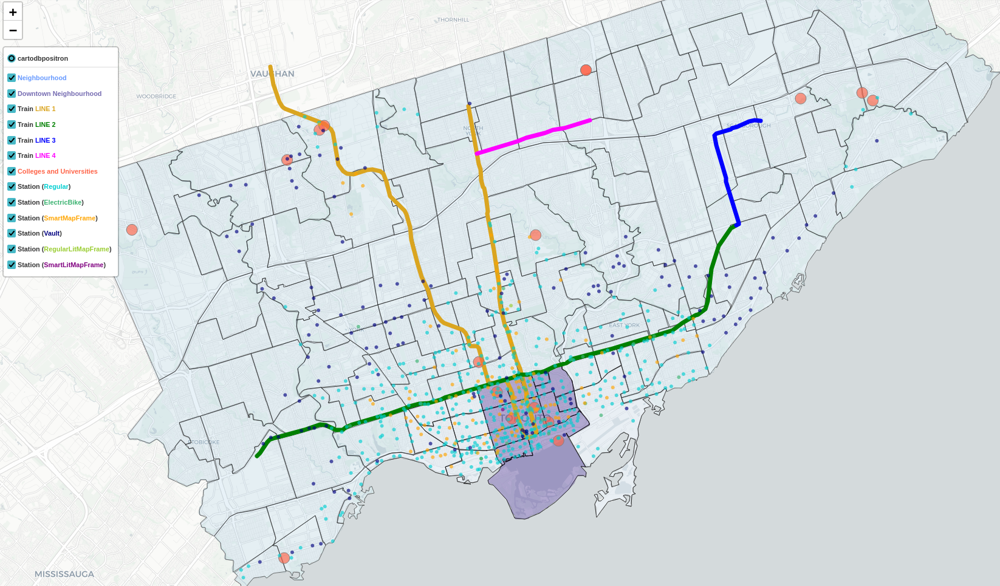

In [22]:
display(Image(os.path.join(figures_dir, '16_curr_stations_map_full.png')))

A zoomed-in version of the full map produced above is shown below

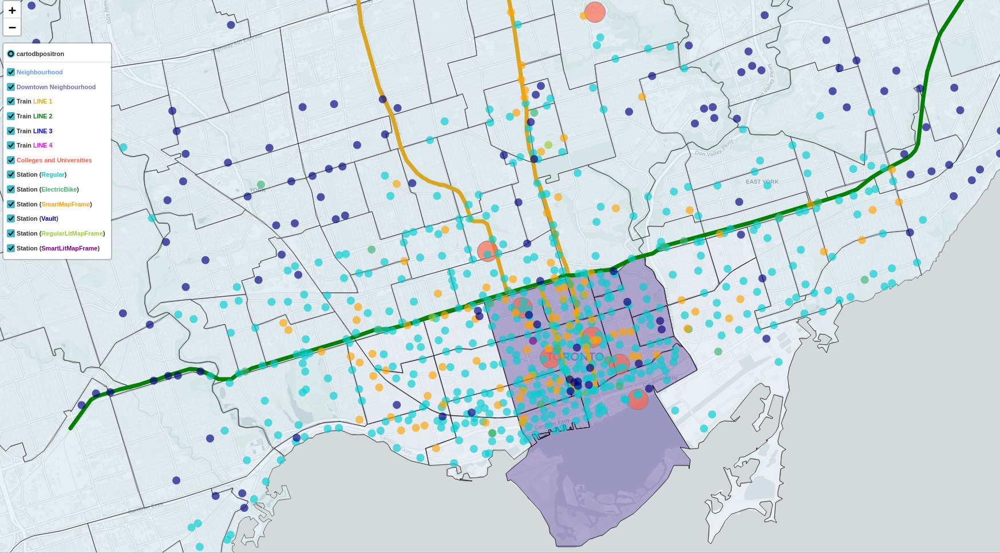

In [23]:
display(Image(os.path.join(figures_dir, '17_curr_stations_map_zoomed.png')))

**Notes**

1. Hovering over a
   - neighbourhood highlights the neighbourhood and displays its name
   - bike share station displays
     - station name
     - physical configuration of the station
       - all six station original configurations are used
       - the three high-level configurations used in exploring station attributes are not included
     - station capacity (number of bike docks at the station)
     - Neighbourhood containing the station
     - Location, in a downtown (*Downtown*) other (*Others*) neighbourhood of the city
   - college or university location displays its name
   - train lines (magenta, green, yellow, blue) does not display anything
2. The city neighbourhoods in downtown Toronto are shaded in light purple.
3. To show/hide components on the map, click the corresponding entry in the legend.

**Observations**

1. Qualitatively, the largest concentration of is in downtown Toronto (neighbourhoods shaded in purple).
2. As we move away from downtown, especially towards the far North and West of the city, the *REGULAR* station configuration which is the preferred choice in Downtown Toronto is replaced by the *VAULT* configuration stations.
3. Bike share is mostly accessible in the southern neighbourhoods of the city. Notably, in the East and West, the north and centrally located neighbourhoods do not have access to the service. These are predominantly residential neighbourhoods. The absence of the service is also noted in the north and central parts of the city. As part of the network's planned expansion, some of the neighbourhoods that currently don't have bike share stations will be getting stations in the future (2023 to 2025).
4. Station locations overlap with the East-West (green) train (subway) line. In Downtown Toronto and just to the north of Downtown, the same overlap is observed with the yellow (North-South) train line.
5. There is a higher density of stations in neighbourhoods immediately to the west of Downtown Toronto than immediately to the east.

### Show Top-Performers

In [24]:
%%time
plot_folium_map(
    gdf_neighs,
    gdf_downtown_neighs,
    gdf_train,
    gdf_colleges_univs,
    gdf_info,
    top_performer_mapper,
    xvar_neighs = 'Neighbourhood',
    yvar_neighs = 'PARENT_AREA_ID',
    yvar_downtown_neighs = 'Downtown',
    marker_opacity = 0.65,
    highlight_marker_fill_opacity = 0.8,
    neigh_highlight_weight = 3,
    neigh_line_thickness = 0.1,
    neigh_style_line_thickness = 0.5,
    neigh_tooltip = ['Neighbourhood', 'Location'],
    neigh_opacity = 0.15,
    neigh_cmap = 'Blues',
    neigh_legend_text_color = '#6699ff',
    downtown_neigh_cmap = 'Purples',
    downtown_neigh_opacity = 0.35,
    downtown_neigh_legend_text_color = '#756bb1',
    colleges_univs_marker_color = "tomato",
    colleges_univs_tooltip = ['Name'],
    colleges_univs_marker_size = 250,
    train_line_thickness = 7,
    stations_marker_size = 200,
    stations_marker_color = 'orange',
    stations_tool_tip=stations_tooltip+['Station Type'],
    station_le_col='le_tp',
    station_color_col='color_tp',
    stations_color_by_col='station_type',
    stations_color_by_col_title='Station Type',
)

CPU times: user 447 ms, sys: 15.9 ms, total: 462 ms
Wall time: 462 ms


The full map produced above is shown below

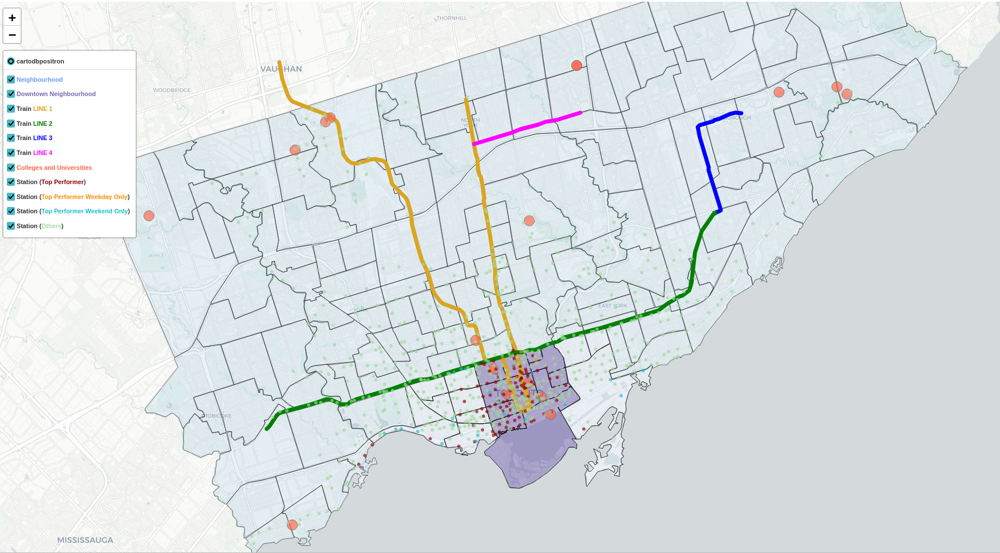

In [25]:
display(Image(os.path.join(figures_dir, '18_top_performers_full.png')))

A zoomed-in version of the full map produced above is shown below

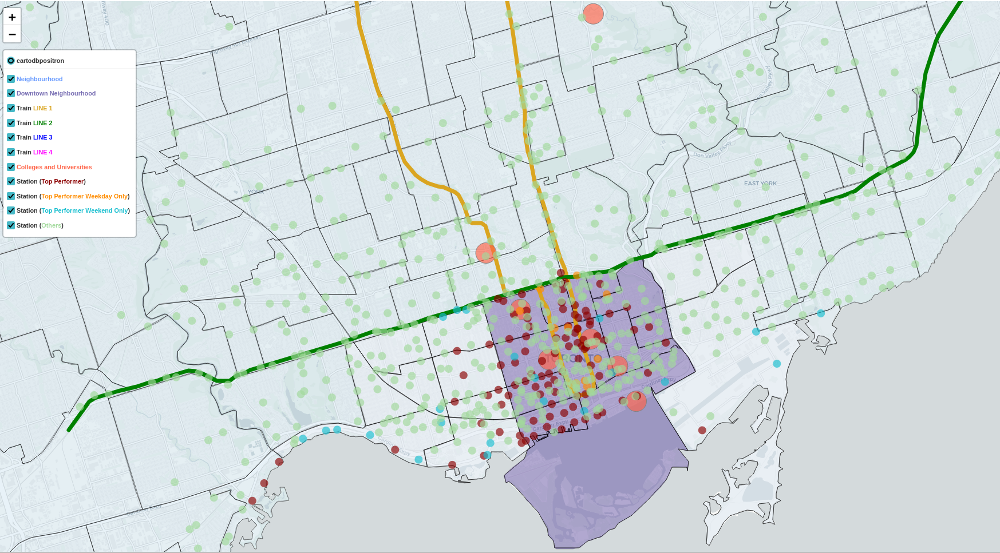

In [26]:
display(Image(os.path.join(figures_dir, '19_top_performers_zoomed.png')))

**Observations**

1. All top-performing stations (shown in dark red) are located south of the green (East West) subway line.
2. As already seen when exploring station attriutes, the majority of top-performing stations are located in Downtown Toronto neighbourhoods and in neighbourhoods located immediately to the west of downtown neighbourhoods. By comparison, there is only one top-performing neighbourhood to the east of Downtown Toronto.
3. All stations that are top-performers on weekdays only are located in Downtown neighbourhoods. This suggests these stations are predominantly used as part of commuter-driven bike share ridership during the workweek (Monday to Friday). Based on findings from temporal analysis of ridreship data, bike share ridership here is likely dominated by hybrid workers who are also bike share users (both Casual and Annual members) whose show a commuter-driven usage pattern.
4. 12 of the 15 stations that are top-performers on weekends only are found west of Downtown neighbourhoods. In findings from the temporal analysis, Casual ridership was dominant and grew strongly during 2022 on weekends. These stations are likely predominantly being used by Casual bike share users on weekends in agreement with the leisurely usage pattern found in temporal analysis.

**Interpretation for Business Use-Case**

Two of the main findings from temporal analysis were the

1. emergence of hybrid workers who use bike share
2. increased growth of ridership by Casual bike share users

Combining these with the observations from the maps above, the following can be recommended

1. The campaign should target bike share stations in Downtown Toronto and in neighbourhoods immediately to its west. This would capture nearly 95% of all top-performing stations. These stations that would have captured the majority of Annual member ridership in 2018 and 2019 and are likely now doing so predominantly for hybrid workers (including both Annual and Casual users) who are bike share users.
2. When looking beyond the boundaries of downtown and choosing between neighbourhoods immediately to its west and east, there is a higher number of
   - overall stations
   - top-performing stations
   - top-performing stations on weekends

   in adjacent western neighbourhoods than in neighbourhoods located immediately to the east of downtown. The top-performing stations (overall and on weekends only) to the west of downtown are predominantly along a [lakefront bike trail](https://greatruns.com/toronto-martin-goodman-trail/). Ridership at these stations is likely dominated by the remaining Casual ridership whose growth was stronger during 2022 than that of Annual ridership. So, when considering stations beyond downtown Toronto, targeting stations located in these western neighbouhoods gives the campaign a better chance of maximizing exposure to fast-growing Casual bike share users.

## Recommendations

Based on the geospatial patterns from above, the top-performing stations located in the Downtown and West of Downtown neighbourhoods should be chosen for displaying ads during the campaign. See discussion in the **Observations** from above for details.

Below are the recommendations for stations to use based on the above geospatial insights

In [27]:
recommended_station_filters = (
    "Location IN ('Downtown', 'West of Downtown')"
    "AND is_top_perform_station = TRUE"
)
df_geo_recommends = (
    pd.DataFrame()
    .assign(recommends_stations=[recommended_station_filters])
    .convert_dtypes()
)
pu.show_df(df_geo_recommends)

column,recommends_stations
dtype,string[python]
nunique,1
missing,0
0,"Location IN ('Downtown', 'West of Downtown')AN..."


Export geospatial recommendations to disk

In [28]:
%%time
fname_prefix = "recommendations_geospatial"
_ = df_geo_recommends.pipe(
    flut.load,
    processed_data_dir,
    fname_prefix,
    my_timezone,
    True,
)

Exported 1 rows of recommendations_geospatial data to /home/jovyan/data/processed/recommendations_geospatial__20240312_103658.parquet.gzip
CPU times: user 16.4 ms, sys: 8.07 ms, total: 24.5 ms
Wall time: 24.1 ms


## Discussion

### Conclusion

1. Based on the density of station locations in the map of the current stations
   - the southern part of the city (below and just above the green train line, line 2) has the most bike share stations
   - the east and west ends of Toronto don't have bike share stations and are mostly residential neighbourhoods (the network expansion introduces stations into some of these neighbourhoods)
   - stations with a `Regular` (which excludes e-bike charging, kiosk-less and ` - lT`) stations account for the majority of station physical configurations seen in Downtown Toronto
   - it is recommended to target stations in the Downtown Toronto neighbourhoods and immediately to its west in order to generate awareness about the MCU program among with the largest fraction of bike share ridership

## Summary of Assumptions

1. Same as in data retrieval and processing step.

## Version Information

In [29]:
packages = [
    'requests',
    'numpy',
    'geopandas',
    'pandas',
    'pyarrow',
    'duckdb',
    'folium',
]
print(
    watermark(
        updated=True,
        current_date=True,
        current_time=True,
        timezone=True,
        custom_time="%Y-%m-%d %H:%M:%S %Z",
        python=True,
        machine=True,
        packages=','.join(packages),
    )
)

Last updated: 2024-03-12 14:36:58 UTC

Python implementation: CPython
Python version       : 3.11.8
IPython version      : 8.22.2

requests : 2.31.0
numpy    : 1.26.4
geopandas: 0.14.3
pandas   : 2.2.1
pyarrow  : 15.0.0
duckdb   : 0.10.0
folium   : 0.16.0

Compiler    : GCC 12.3.0
OS          : Linux
Release     : 6.6.10-76060610-generic
Machine     : x86_64
Processor   : x86_64
CPU cores   : 12
Architecture: 64bit

